In [1]:
import arviz as az
import bambi as bmb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pt
import preliz as pz
from scipy.special import expit as logistic
import xarray as xr

In [2]:
az.style.use('arviz-doc')

In [3]:
%%HTML
<style>

.CodeMirror {
    width: 100vw;
}

.container {
    width: 99% !important;
}

.rendered_html {
  font-size:0.8em;
}
.rendered_html table, .rendered_html th, .rendered_html tr, .rendered_html td {
     font-size: 100%;
}


body {
  font-family: Ubuntu;
  background: #F0F0F0;
  background-color: #F0F0F0;
}


.reveal h1,
.reveal h2,
.reveal h3,
.reveal h4,
.reveal h5,
.reveal h6 {
  margin: 0 0 20px 0;
  color: #2a2eec;
  font-family: Ubuntu;
  line-height: 0.9em;
  letter-spacing: 0.02em;
  text-transform: none;
  text-shadow: none;
}

.reveal blockquote {
  display: block;
  position: relative;
  background: #fa7c17;
  border-radius: 15px;
  box-shadow: 0px 0px 2px rgba(0, 0, 0, 0.2);
  font-weight: bold;
}

</style>

In [4]:
from traitlets.config.manager import BaseJSONConfigManager
path = "/home/osvaldo/anaconda3/etc/jupyter/nbconfig"
cm = BaseJSONConfigManager(config_dir=path)
cm.update("livereveal", {
              "theme": "serif",
              "transition": "zoom",
              "start_slideshow_at": "selected",
              "controls": "True",
              "progress": "False",
              "shortcut": "False"});

<center><img src="img/Logo_UNSAM.png" width="200"></center>
<br>
<br>
<h1 align="center">Procesos Gaussianos</h1>    


<br>
<br>
<br>
<br>
<br>

## Objetivos

<br>

Introducción a:

* Funciones como objetos probabilistas
* Kernels
* Procesos Gaussianos con likelihoods Gaussianos
* Procesos Gaussianos con likelihoods no-gaussianos
* Procesos Gaussianos en espacios de Hilbert


## Funciones no-lineales

<br>
Vimos que podíamos excribir GLMs como:

$$
\begin{aligned}
\mu &= \alpha + \beta X \\
Y &\sim \phi(L(\mu), \theta)
\end{aligned}
$$

* El objetivo de este capítulo es generar modelos de la forma de:

$$
\begin{aligned}
\mu &= f(X) \\
Y &\sim \phi(L(\mu), \theta)
\end{aligned}
$$

donde $f$ es una función que aproximamos de form no paramétrica.
<br>


## Funciones y sus representaciones

<br>

* Podemos pensar en una función $f$ como un mapeo desde un conjunto de entradas $x$ a un conjunto de salidas $y$:

$$
y = f(x)
$$

* ej. $f(x) = \sin(x), \quad  \mathbb{R} \to [-1, 1]$

In [5]:
np.set_printoptions(precision=3, suppress=True)
x0 = np.linspace(0, 2 * np.pi, 10)
np.stack([x0, np.sin(x0)]).T

array([[ 0.   ,  0.   ],
       [ 0.698,  0.643],
       [ 1.396,  0.985],
       [ 2.094,  0.866],
       [ 2.793,  0.342],
       [ 3.491, -0.342],
       [ 4.189, -0.866],
       [ 4.887, -0.985],
       [ 5.585, -0.643],
       [ 6.283, -0.   ]])

## Funciones y sus representaciones

<br>
<br>

* Al graficar una función solo evaluamos la función en unos pocos puntos, pero los sistemas de gráficos como matplotlib interpolan los valores intermedios lo que nos permite obtener una representación que aparenta ser continua.

<br>

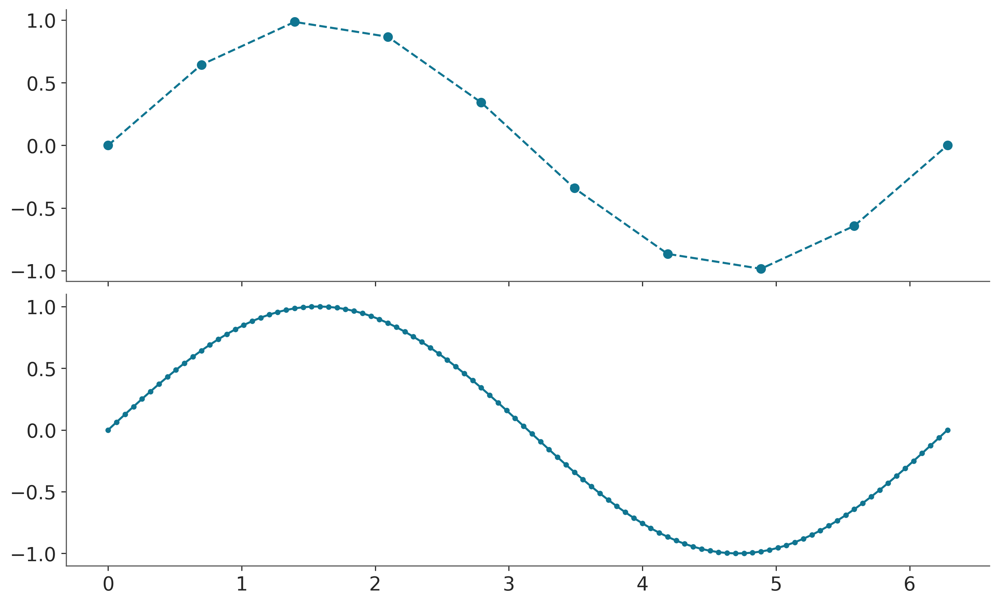

In [6]:
x1 = np.linspace(0, 2 * np.pi, 100)
_, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
ax[0].plot(x0, np.sin(x0), "o--", color="C0")
ax[1].plot(x1, np.sin(x1), ".-", color="C0");

## Funciones y sus representaciones

<br>
<br>

* Podemos pensar una función como una lista ordenada/indexada de valores $(X_i, Y_i)$. 
* En principio la lista podría ser infinita, pero por cuestiones prácticas siempre será finita. 

* Hasta ahora nada nuevo. La pregunta es como podemos generalizar esta idea para representar funciones probabilísticamente. 

<br>

## Funciones probabilistas

<br>
<br>

* Vamos a usar los valore de $X_i$ como índices y les vamos a asociar una variable aleatoria, que al muestrear nos dará el valor de $Y_i$ 
* Por simplicidad, vamos a asumir que la distribución asociada es una Gaussiana. 
* Las Gaussianas son conceptualmente fáciles de entender y posen varias propiedades matemáticas que hace simple trabajar con ellas, o al menos más simple que otras alternativas.

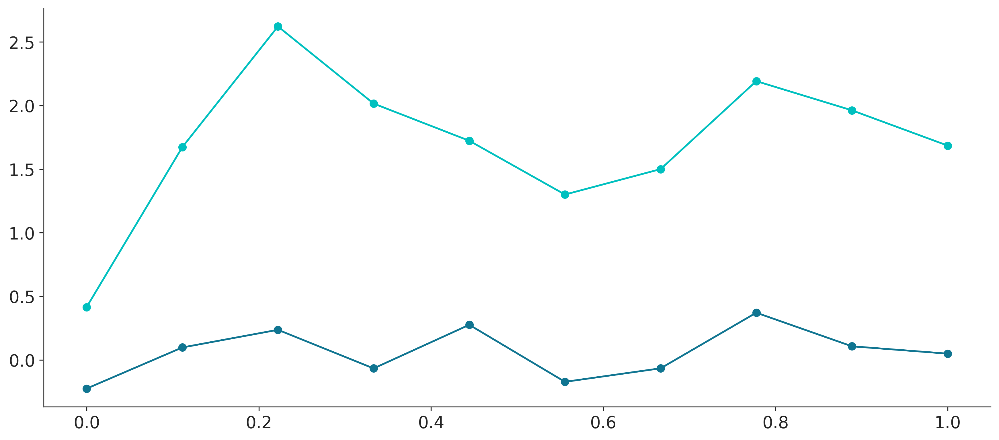

In [7]:
np.random.seed(237)

x = np.linspace(0, 1, 10)
y = pz.Normal(0, 0.2).rvs(len(x), random_state=237)

plt.plot(x, y, 'o-')

y = np.zeros_like(x)
for i in range(len(x)):
    y[i] = np.random.normal(y[i-1], 0.5)

plt.plot(x, y, 'o-');

## Funciones probabilistas

<br>
<br>

* En principio con este "truco" podemos aproximar muchas funciones
* El resultado dependerá de los valores de $x$ y de los parámetros de cada distribución Normal
* Pero este procedimiento parece un poco rudimentario como para ser útil en la práctica, demasiado "ad-hoc" y poco generalizable

<br>
<br>

## Funciones probabilistas

<br>
<br>

* Y si reemplazamos las $n$ gaussianas univariadas por una sola Gaussiana multivariada de dimensión $n$?
* Una Gaussiana multivariada se define por una vector media y una matriz de covarianza. 
* La matriz de covarianza representa la relación entre las diferentes variables aleatorias.

<br>
<br>

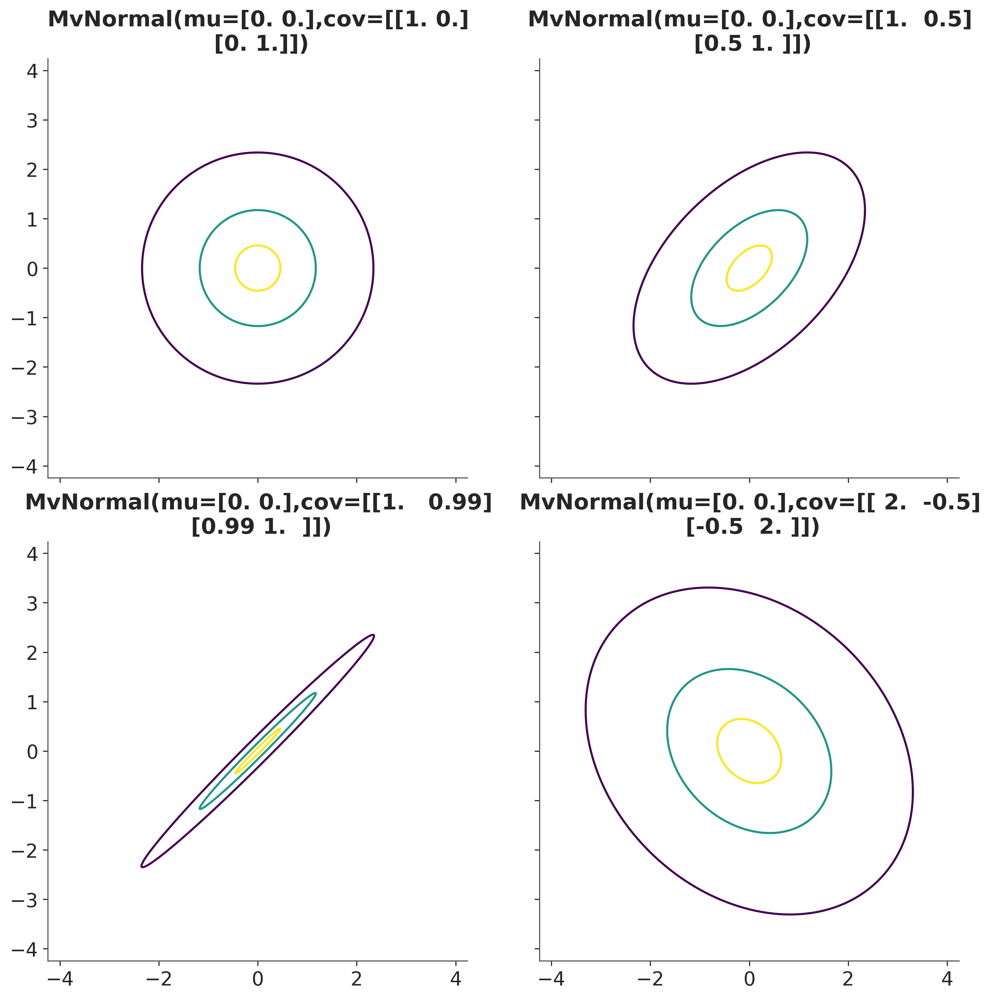

In [8]:
_, axes = plt.subplots(2,2, figsize=(10, 10), sharex=True, sharey=True)

for cov, ax in zip([[[1, 0], [0, 1]], 
                    [[1, 0.5], [0.5, 1]], 
                    [[1, 0.99], [0.99, 1]], 
                    [[2, -0.5], [-0.5, 2]]], axes.ravel()):
    pz.MvNormal([0, 0], cov).plot_pdf(marginals=False, ax=ax)

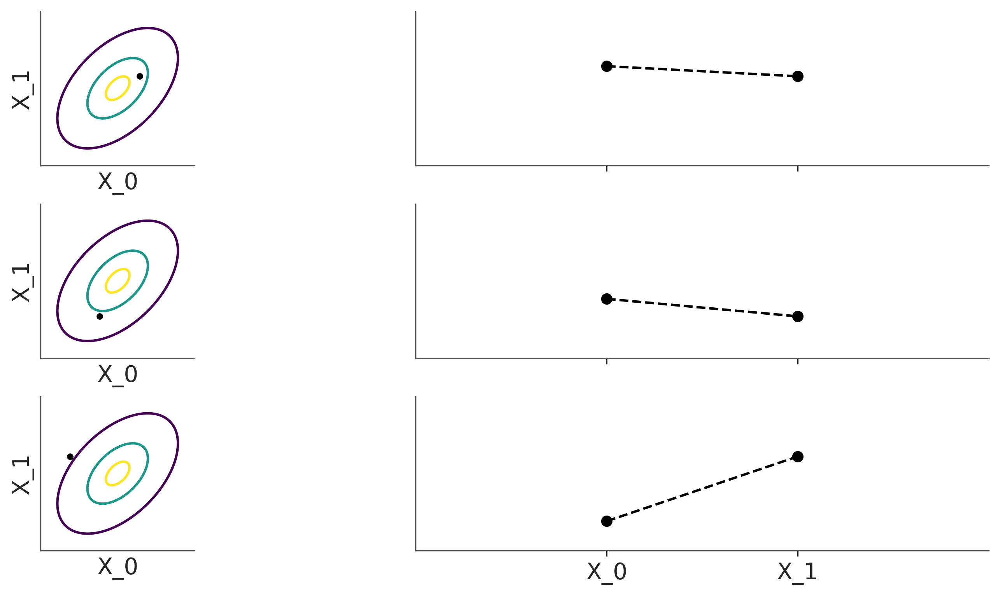

In [9]:
_, axes = plt.subplots(3,2, figsize=(10, 5), sharex="col", sharey=True)
dist = pz.MvNormal([0, 0], [[1, 0.5], [0.5, 1]])
vals = dist.rvs(3, random_state=239)
for idx, v in enumerate(vals):
    dist.plot_pdf(marginals=False, ax=axes[idx,0])
    axes[idx,0].set_title("")
    axes[idx,0].plot(*v, "k.")
    axes[idx, 1].plot([-1, 1], v, "ko--")
    axes[idx, 1].set_xticks([-1, 1], ["X_0", "X_1"])
    axes[idx, 1].set_xlim(-3, 3)
    axes[idx, 1].set_yticks([])
    axes[idx, 0].set_xticks([])
    axes[idx, 0].set_xlabel("X_0")
    axes[idx, 0].set_ylabel("X_1")

## Funciones probabilistas

<br>
<br>

* Hasta ahora hemos venido hablando de funciones como objetos probabilísticos desde una perspectiva que parece un poco artificial
* Hicimos este recorrido, a fin de generar intuición. 
* Sin embargo, es posible formalizar de forma rigurosa la representación de funciones como procesos estocástico.

<br>
<br>

## Procesos estocásticos

<br>

> Un proceso estocástico es una colección de variables aleatorias indexadas por un conjunto de índices. Asi como una muestra de una distribución unidimensional es un número, una muestra (o realización) de un proceso estocástico es una función. Por ello a los procesos estocásticos se los suele llamar función aleatoria. 

* Es común que los índices representen tiempo, pero esto no es necesario. 
* En los ejemplos anteriores los indices vienen dados por lo valores de $X_i$ y las variables aleatorias son los valores de $Y_i$. 
* Es importante notar que estos índices no necesariamente son enteros, de hecho en general son reales 

<br>

## Procesos Gaussianos

<br>
<br>

> Un proceso gaussiano (GP) es un proceso estocástico tal que cualquier subconjunto finito de variables aleatorias tiene una distribución Gaussiana. 

* Un GP es _como_ una Gaussiana multivariada pero de dimensión infinita
* Si la evaluamos en cualquier conjunto finito de tamaño $N$ obtenemos una Gaussiana multivariada de dimensión $N$.
* Es decir al marginalizar sobre todos los puntos NO observados obtenemos una Gaussiana multivariada definida por los puntos observados!

<br>
<br>

## Procesos Gaussianos

<br>
<br>

* El principal interés de los GPs en estadística Bayesiana, es que podemos pensarlos con una distribución sobre funciones. 
* Un GP, se define estrictamente por un vector media infinito y una matriz de covarianza infinita
* En la práctica usamos un vector media y una matriz de covarianza finitas. 
* Además es común trabajar con un vector media cero, por lo que el GP queda definido de forma completa por la matriz de covarianza. 

<br>
<br>

## Kernels

<br>
<br>

* En la práctica, las matrices de covarianza se especifican mediante funciones conocidas como kernels. 
* Cuando estemos hablando de GPs llamaremos kernel a cualquier función que devuelva una matriz de covarianza válida.

<br>
<br>

### Kernels


Hay muchos kernels útiles, uno popular es el kernel cuadrático exponencial:

$$
\kappa(\mathbf{X}, \mathbf{X'}) = \exp\left(-\frac{\|\mathbf{X} - \mathbf{X'}\|^2}{2\ell^2}\right)
$$

* $\|\mathbf{X} - \mathbf{X'}\|^2$ es la distancia euclidea al cuadrado
* $\ell$ se conoce como la longitud de escala (o ancho de banda o varianza) y controla el "ancho" del kernel.

In [10]:
def exp_quad_kernel(x, xi, ℓ=1):
    """kernel cuadrático exponencial"""
    return np.array([np.exp(-(x-x_i)**2 / (2*ℓ**2)) for x_i in xi])


labels = ["A", "B", "C"]
datos = np.array([-1, 0.7, 1.5])
cov = exp_quad_kernel(datos, datos, 1)

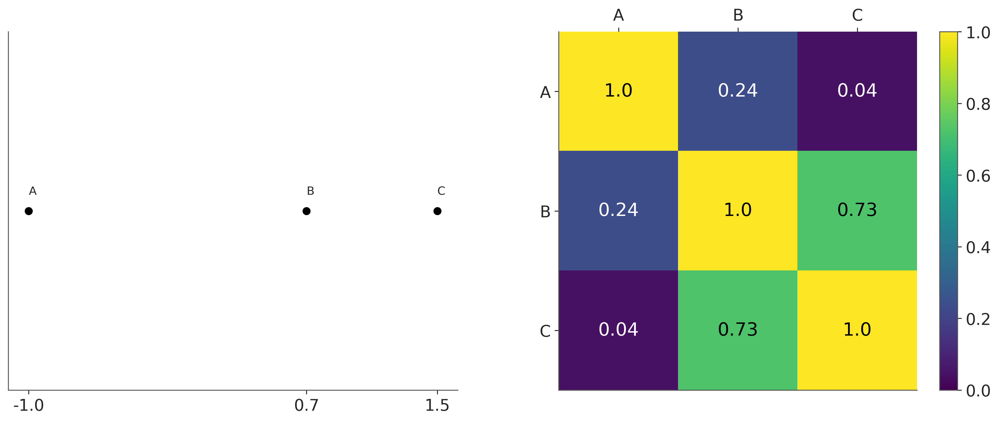

In [11]:

fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax = np.ravel(ax)

ax[0].plot(datos, np.zeros_like(datos), 'ko')
ax[0].set_yticks([])
for i, l in zip(datos, labels):
    ax[0].text(i, 0+0.005, l)
ax[0].set_xticks(datos)
ax[0].set_xticklabels(np.round(datos, 2))

ax[1].grid(False)
im = ax[1].imshow(cov, vmin=0, vmax=1)
colors = ['w', 'k']
for i in range(len(cov)):
    for j in range(len(cov)):
        ax[1].text(j, i, round(cov[i, j], 2),
                   color=colors[int(im.norm(cov[i, j]) > 0.5)],
                   ha='center', va='center', fontdict={'size': 16})
ax[1].set_xticks(range(len(datos)), labels)
ax[1].set_yticks(range(len(datos)), labels)
ax[1].xaxis.tick_top()
fig.colorbar(im, ax=ax[1]);

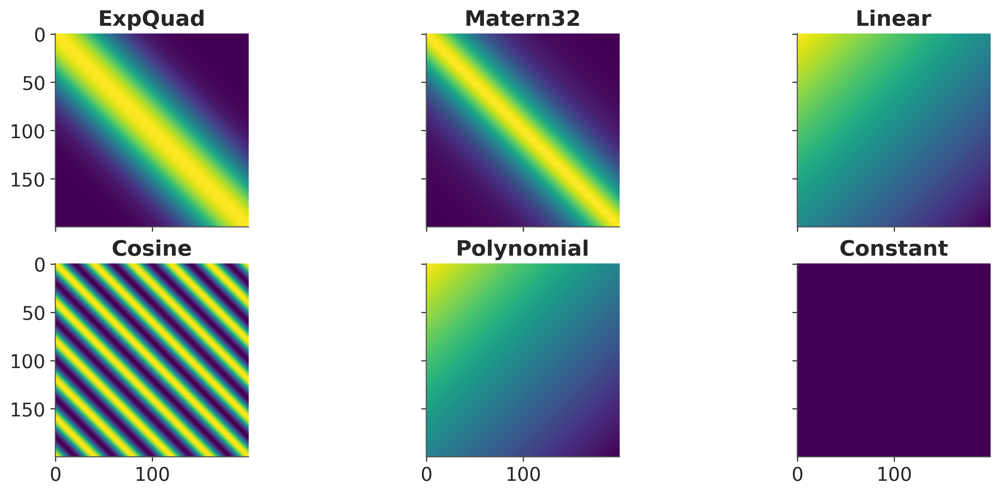

In [12]:
#| code-fold: true
X = np.linspace(0, 5, 200)[:,None]

fig, ax = plt.subplots(2, 3, sharex=True, sharey=True)
covs = [pm.gp.cov.ExpQuad(input_dim=1, ls=1), 
        pm.gp.cov.Matern32(input_dim=1, ls=1),
        pm.gp.cov.Linear(input_dim=1, c=50),
        pm.gp.cov.Cosine(input_dim=1, ls=1),
        pm.gp.cov.Polynomial(input_dim=1, c=70, d=3, offset=0),
        pm.gp.cov.Constant(c=50),
       ]
        
for cov, ax in zip(covs, ax.ravel()):
    m = ax.imshow(cov(X).eval())
    ax.set_title(cov.__class__.__name__)
#ax.set_xticks([])
#ax.set_yticks([]);

## Mejor que matrices, funciones

<br>
<br>

* Analizar las matrices de covarianzas inducidas por los kernels puede ser útil para una mejor comprensión matemática
* En la práctica suele ser conveniente observar directamente el tipo de funciones inducidas


```python
kernel = pm.gp.cov.ExpQuad(.)
cov = kernel(test_points).eval()
plt.plot(test_points, pz.MvNormal(mu=np.zeros_like(test_points),
                                  cov=cov).rvs())
```
    
<br>
<br>

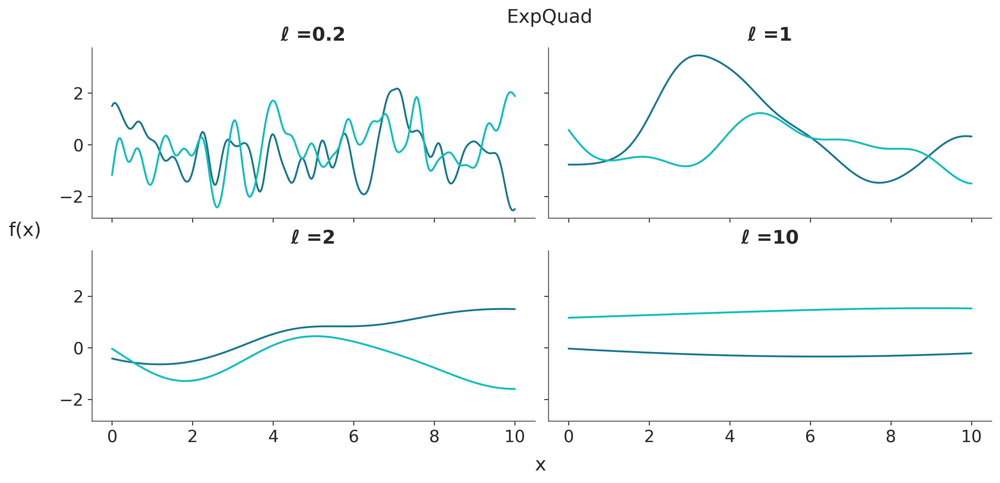

In [13]:
np.random.seed(24)
test_points = np.linspace(0, 10, 300)[:,None]
fig, ax = plt.subplots(2, 2, figsize=(11, 5), sharex=True, sharey=True)
ax = np.ravel(ax)

for idx, ℓ in enumerate((0.2, 1, 2, 10)):
    cov = pm.gp.cov.ExpQuad(input_dim=1, ls=ℓ)
    ax[idx].plot(test_points, pz.MvNormal(mu=np.zeros_like(test_points)[:,0],
                                          cov=cov(test_points).eval()).rvs(2).T)
    ax[idx].set_title(f'ℓ ={ℓ}')
fig.text(0.48, 1, 'ExpQuad', fontsize=16)
fig.text(0.51, -0.05, 'x', fontsize=16)
fig.text(-0.05, 0.5, 'f(x)', fontsize=16);

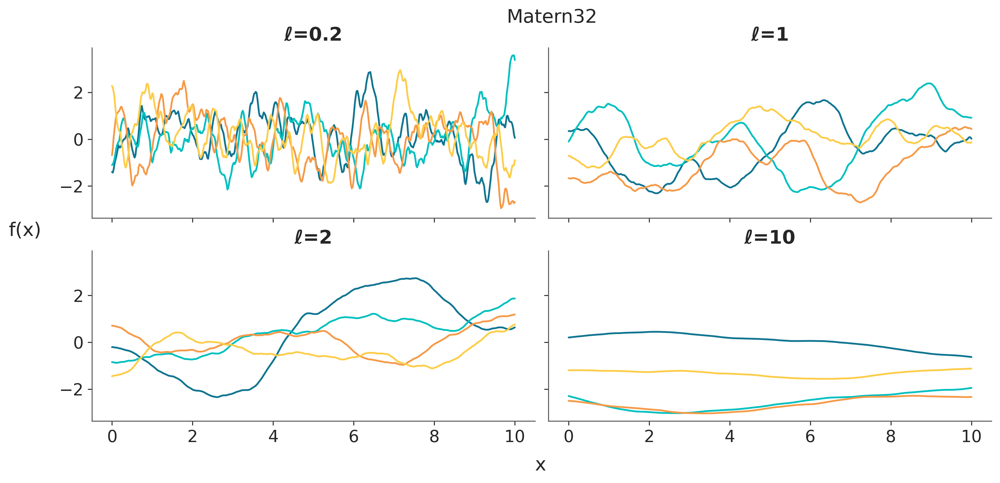

In [14]:
#| code-fold: true
np.random.seed(24)
test_points = np.linspace(0, 10, 500)[:,None]
fig, ax = plt.subplots(2, 2, figsize=(11, 5), sharex=True, sharey=True)
ax = np.ravel(ax)

for idx, ℓ in enumerate((0.2, 1, 2, 10)):
    cov = pm.gp.cov.Matern32(input_dim=1, ls=ℓ)
    ax[idx].plot(test_points, pz.MvNormal(mu=np.zeros_like(test_points)[:,0],
                                          cov=cov(test_points).eval()).rvs(4).T)
    ax[idx].set_title(f'ℓ={ℓ}')
fig.text(0.48, 1, 'Matern32', fontsize=16)
fig.text(0.51, -0.05, 'x', fontsize=16)
fig.text(-0.05, 0.5, 'f(x)', fontsize=16);

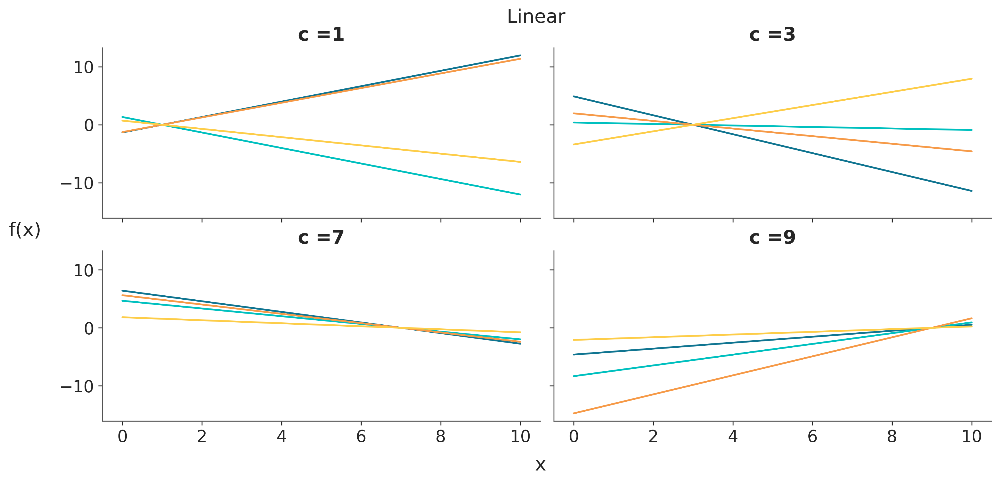

In [15]:
#| code-fold: true
np.random.seed(24)
test_points = np.linspace(0, 10, 20)[:,None]
fig, ax = plt.subplots(2, 2, figsize=(11, 5), sharex=True, sharey=True)
ax = np.ravel(ax)

for idx, c in enumerate((1, 3, 7, 9)):
    cov = pm.gp.cov.Linear(input_dim=1, c=c)
    ax[idx].plot(test_points, pz.MvNormal(mu=np.zeros_like(test_points)[:,0],
                                          cov=cov(test_points).eval()).rvs(4).T)
    ax[idx].set_title(f'c ={c}')
fig.text(0.48, 1, 'Linear', fontsize=16)
fig.text(0.51, -0.05, 'x', fontsize=16)
fig.text(-0.05, 0.5, 'f(x)', fontsize=16);

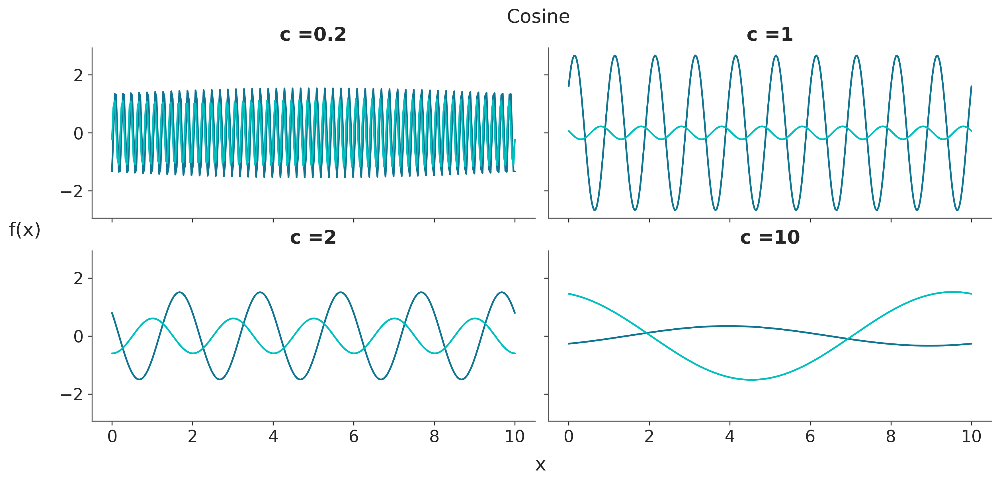

In [16]:
#| code-fold: true
np.random.seed(24)
test_points = np.linspace(0, 10, 300)[:,None]
fig, ax = plt.subplots(2, 2, figsize=(11, 5), sharex=True, sharey=True)
ax = np.ravel(ax)

for idx, ℓ in enumerate((0.2, 1, 2, 10)):
    cov = pm.gp.cov.Cosine(input_dim=1, ls=ℓ)
    ax[idx].plot(test_points, pz.MvNormal(mu=np.zeros_like(test_points)[:,0],
                                          cov=cov(test_points).eval()).rvs(2).T)
    ax[idx].set_title(f'c ={ℓ}')
fig.text(0.48, 1, 'Cosine', fontsize=16)
fig.text(0.51, -0.05, 'x', fontsize=16)
fig.text(-0.05, 0.5, 'f(x)', fontsize=16);

## GPs y regresión

Los procesos gaussianos son distribuciones a priori sobre funciones, es decir podemos escribir


$$
f(x) \sim \mathcal{GP}(\mathbf{\mu}, \mathbf{\Sigma})
$$

Donde $\mathcal{GP}$ representa un proceso Gaussiano con función media $\mathbf{\mu}$ y función de covarianza $\mathbf{\Sigma}$

## GPs y regresión


Si la distribución a priori es un GP y el likelihood es una Gaussiana con varianza $\sigma^2$, entonces la distribución a posteriori es también un GP de la siguiente forma:

$$
p(Y \mid \psi, \sigma) \sim \mathcal{N}(\mathbf{\mu}_{\text{post}}, \mathbf{\Sigma}_{\text{post}})
$$

Donde $k$ es un kernel con (hiper)parámetros $\psi$ y

$$
\mathbf{\mu}_{\text{post}} =  k(\mathbf{X}, \mathbf{X'}) \left[k(\mathbf{X}, \mathbf{X}) + \sigma^2 I \right]^{-1} Y
$$

$$
\mathbf{\Sigma}_{\text{post}} = k(\mathbf{X'}, \mathbf{X'}) - k(\mathbf{X'}, \mathbf{X}) \left[ k(\mathbf{X}, \mathbf{X}) + \sigma^2 I \right]^{-1} k(\mathbf{X}, \mathbf{X'})
$$

## GPs y PyMC

PyMC tiene un módulo `gp`, el cual tiene distintas implementaciones de GPs, estas implementaciones varían, por ejemplo, si el likelihood es o no Gaussiano. A fin de ejemplificar su uso, generemos un dataset sintético.

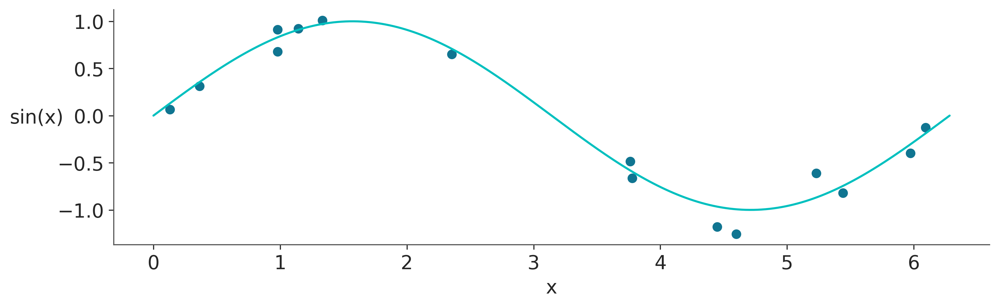

In [17]:
np.random.seed(42)
x = np.random.uniform(0, 2 * np.pi, size=15)
y = np.random.normal(np.sin(x), 0.1)


_, ax = plt.subplots(figsize=(10, 3))
ax.plot(x, y, 'o')
true_x = np.linspace(0, 2 * np.pi, 200)
ax.plot(true_x, np.sin(true_x), 'C1')
ax.set_xlabel('x')
ax.set_ylabel('sin(x)', rotation=0, labelpad=15);

In [18]:
# Se espera que X tenga dimensión 2, incluso si lo tenemos una variable/feature
X = x[:, None]

with pm.Model() as modelo_reg:
    # hyperprior para la longitud de escala
    ℓ = pm.Exponential("ℓ", 0.5)
    
    # instanciamos la función de covarianza
    cov = pm.gp.cov.ExpQuad(1, ls=ℓ)
    # instanciamos el GP (prior)
    gp = pm.gp.Marginal(cov_func=cov)

    σ = pm.HalfNormal('σ', 25)

    y_pred = gp.marginal_likelihood('y_pred', X=X, y=y, sigma=σ)
    idata_reg = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ℓ, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


In [19]:
X_new = np.linspace(np.floor(x.min()), np.ceil(x.max()), 100)[:,None]

with modelo_reg:
    f_pred = gp.conditional('f_pred', X_new)

In [20]:
with modelo_reg:
    idata_reg_subset = idata_reg.sel(draw=slice(0, None, 100))
    pred_samples = pm.sample_posterior_predictive(idata_reg_subset,
                                                  var_names=["f_pred"],
                                                  random_seed=123)

f_pred = az.extract(pred_samples, group="posterior_predictive")['f_pred']

Sampling: [f_pred]


Output()

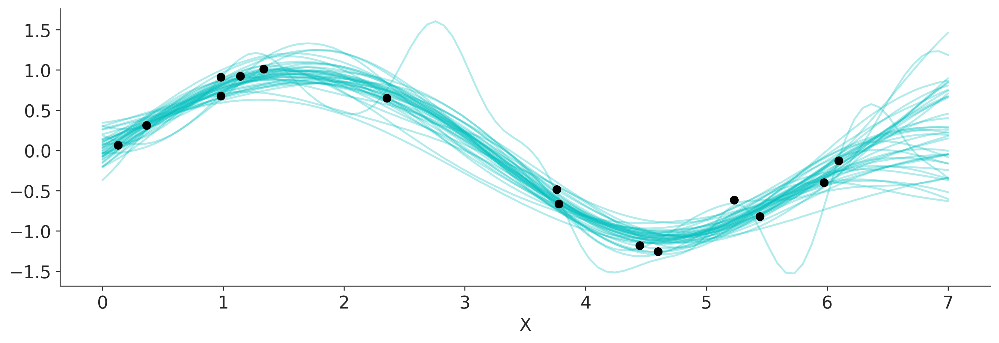

In [21]:
_, ax = plt.subplots(figsize=(11, 3.7))
ax.plot(X_new, f_pred, 'C1-', alpha=0.3)
ax.plot(X, y, 'ko')
ax.set_xlabel('X');

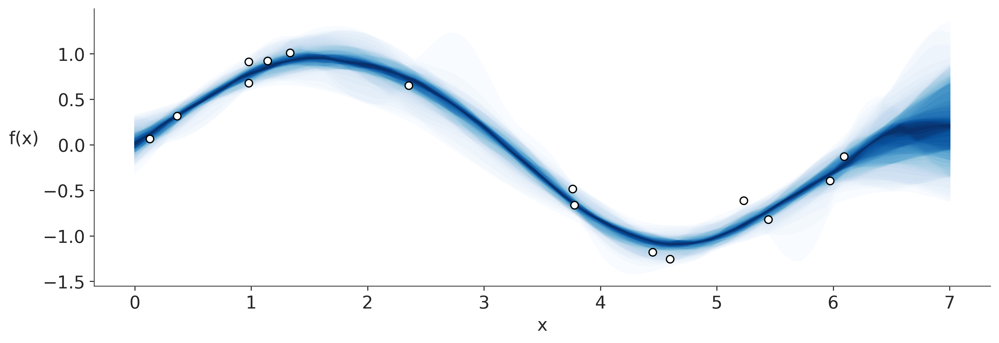

In [22]:
_, ax = plt.subplots(figsize=(11, 3.7))

pm.gp.util.plot_gp_dist(ax, f_pred.T, X_new, palette='Blues', plot_samples=False);

ax.plot(X, y, 'wo', mec='k')
ax.set_xlabel('x')
ax.set_ylabel('f(x)', rotation=0, labelpad=15);

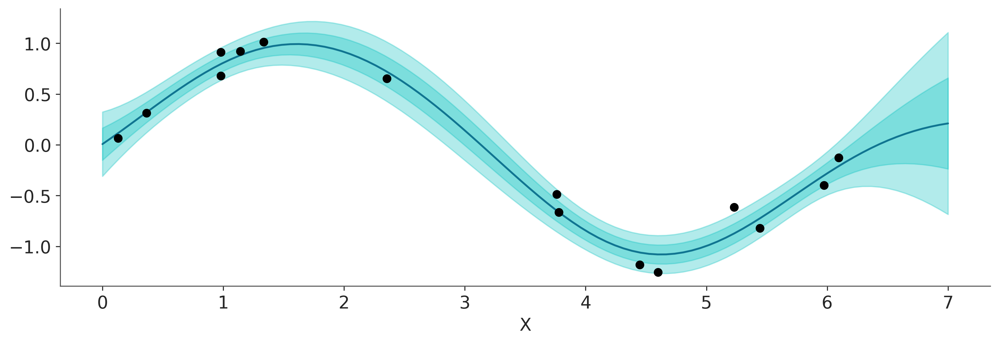

In [23]:
# plot the results
_, ax = plt.subplots(figsize=(11, 3.7))

# predict
point = {'ℓ': idata_reg.posterior['ℓ'].mean(), 'σ': idata_reg.posterior['σ'].mean()}
mu, var = gp.predict(X_new, point=point, diag=True,  model=modelo_reg)
sd = var**0.5

# plot mean and 1σ and 2σ intervals
ax.plot(X_new, mu, 'C0')
ax.fill_between(X_new.flatten(),
                 mu - sd, mu + sd,
                 color="C1",
                 alpha=0.3)

ax.fill_between(X_new.flatten(),
                 mu - 2*sd, mu + 2*sd,
                 color="C1",
                 alpha=0.3)

ax.plot(X, y, 'ko')
ax.set_xlabel('X');

## Prior para la longitud de escala

<br>
<br>

* Las distribuciones a priori para la longitud de escala que evitan el cero y/o asignan poca masa a valores _muy pequeños_ suelen funcionar mejor. 
* Como ya vimos, $\ell$ controla cuan distintos son dos valores, un valor de 0 (o cercano) para $\ell$ implica que todo es distinto a todo. 
* En decir funciones que varían rápido y son poco suaves. 
* Además, es deseables que los valores de $\ell$ se encuentren en el rango de los datos. 

* Es por ello que es común usar distribuciones Gama o Gama Inversa ajustada _debilmente_ según los datos.

<br>

In [24]:
def get_ig_params(x_vals, l_b=None, u_b=None, mass=0.95, plot=False):
    """
    Returns a weakly informative prior for the length-scale parameter of the GP kernel.
    """

    differences = np.abs(np.subtract.outer(x_vals, x_vals))
    if l_b is None:
        l_b = np.min(differences[differences != 0]) * 2
    if u_b is None:
        u_b = np.max(differences) / 1.5

    dist = pz.InverseGamma()
    pz.maxent(dist, l_b, u_b, mass, plot=plot)

    return dict(zip(dist.param_names, dist.params))

## GPs generalizados

<br>

* El objetivo de este capítulo es generar modelos de la forma de:

$$
\begin{aligned}
\mu &\sim \mathcal{GP}([0, 0 \cdots 0], \mathbf{\Sigma}) \\
Y &\sim \phi(L(\mu), \theta)
\end{aligned}
$$

<br>

In [25]:
iris = pd.read_csv('../datos/iris.csv')
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [26]:
df = iris.query("species == ('setosa', 'versicolor')")
y = pd.Categorical(df['species']).codes
x_1 = df['sepal_length'].values
X_1 = x_1[:, None]

In [27]:
with pm.Model() as modelo_iris:
    ℓ = pm.InverseGamma('ℓ', **get_ig_params(x_1))
    cov = pm.gp.cov.ExpQuad(1, ℓ)
    gp = pm.gp.Latent(cov_func=cov)
    f = gp.prior("f", X=X_1)
    
    y_ = pm.Bernoulli("y_", p=pm.math.sigmoid(f), observed=y)
    idata_iris = pm.sample(target_accept=0.85, random_seed=452)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ℓ, f_rotated_]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.


In [28]:
X_new = np.linspace(np.floor(x_1.min()), np.ceil(x_1.max()), 200)[:, None]

with modelo_iris:
    f_pred = gp.conditional('f_pred', X_new) 
    idata_iris_subset = idata_iris.sel(draw=slice(0, None, 100))
    pred_samples = pm.sample_posterior_predictive(idata_iris_subset, var_names=["f_pred"], random_seed=123)


f_pred_iris = az.extract(pred_samples, group="posterior_predictive")['f_pred'].values

Sampling: [f_pred]


Output()

/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/plots/hdiplot.py:161: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


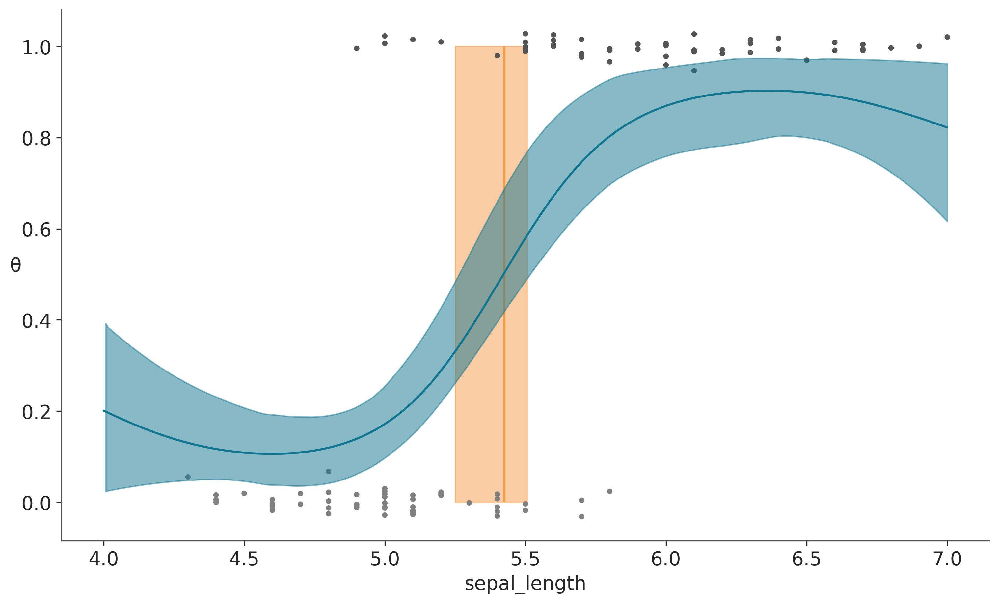

In [29]:
#| code-fold: true

_, ax = plt.subplots(figsize=(10, 6))

fp = logistic(f_pred_iris)
fp_mean = np.mean(fp, 1)

ax.plot(X_new[:, 0], fp_mean)
ax.scatter(x_1, np.random.normal(y, 0.02),
           marker='.', color=[f'{1/(x+2)}' for x in y])

az.plot_hdi(X_new[:, 0], fp.T, color='C0')

decision_boundary = 0.5
db = X_new[:,0][np.argmin(np.abs(fp - decision_boundary), 0)]
db_mean = db.mean()
db_hdi = az.hdi(db)
ax.vlines(db_mean, 0, 1, color='C2', zorder=-1)
ax.fill_betweenx([0, 1], db_hdi[0], db_hdi[1], color='C2', alpha=0.5, zorder=-1)
ax.set_xlabel('sepal_length')
ax.set_ylabel('θ', rotation=0);

## Regresión al prior

<br>
<br>

* Cuando hay pocos o ningún dato disponible, la distribución a posterior para un GP tenderá a _revertir_ hacia la función a priori. 
* Esto tiene sentido si pensamos que, en ausencia de datos, cualquier distribución a posteriori debería ser esencialmente la distribución a priori.
* Esto suele ser deseable cuando el prior es razonable


<br>
<br>

## Combinación de kernels

<br>
<br>

* Una característica que le da mayor versatilidad a los GPs, es que es posible combinar kernel y obtener nuevos comportamientos. 
* Usualmente los kernels se combinan sumandolos o multiplicándolos

<br>
<br>

## Combinación de kernels

<br>
<br>

*  A continuación vamos a crear un modelo que combina 3 kernels:

* cuadrático exponencial
* lineal
* ruido blanco

<br>
<br>

In [30]:
with pm.Model() as model_iris2:
    ℓ = pm.InverseGamma('ℓ', **get_ig_params(x_1))
    c = pm.Normal('c', x_1.min())
    τ = pm.HalfNormal('τ', 5)
    cov = (pm.gp.cov.ExpQuad(1, ℓ) +
           τ * pm.gp.cov.Linear(1, c) +
           pm.gp.cov.WhiteNoise(1E-5))
    gp = pm.gp.Latent(cov_func=cov)
    f = gp.prior("f", X=X_1)

    y_ = pm.Bernoulli("y", p=pm.math.sigmoid(f), observed=y)
    idata_iris2 = pm.sample(target_accept=0.9, random_seed=452)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ℓ, c, τ, f_rotated_]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 70 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.


In [31]:
X_new = np.linspace(np.floor(x_1.min()), np.ceil(x_1.max()), 100)[:, None]
with model_iris2:
    f_pred = gp.conditional('f_pred', X_new) 
    idata_iris2_subset = idata_iris2.sel(draw=slice(0, None, 100))
    pred_samples2 = pm.sample_posterior_predictive(idata_iris2_subset,
                                                   var_names=["f_pred"],
                                                   random_seed=123)  


f_pred_iris2 = az.extract(pred_samples2, group="posterior_predictive")['f_pred'].values

Sampling: [f_pred]


Output()

/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/plots/hdiplot.py:161: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


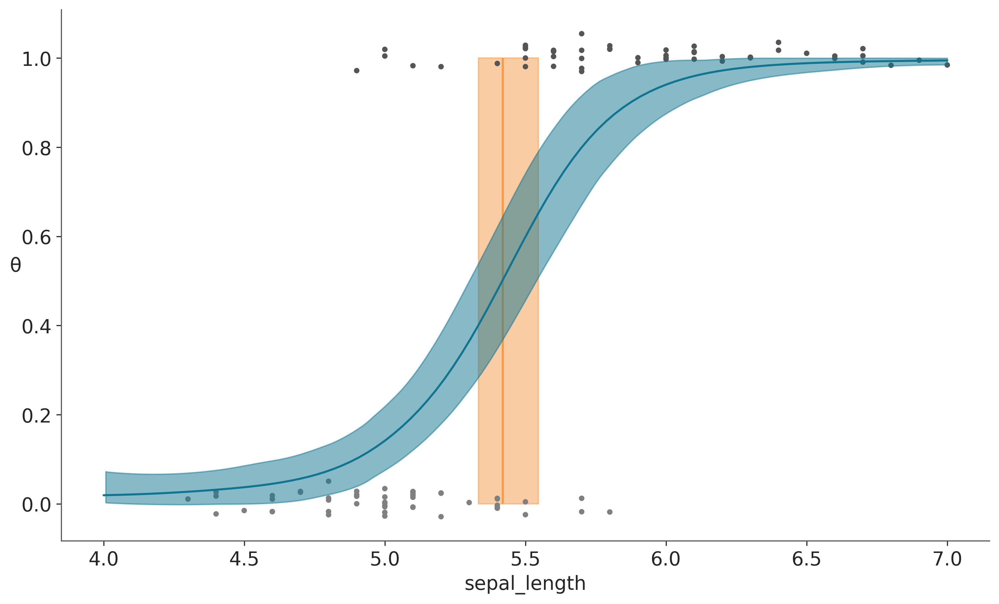

In [32]:
_, ax = plt.subplots(figsize=(10, 6))

fp = logistic(f_pred_iris2)
fp_mean = np.mean(fp, 1)

ax.plot(X_new[:, 0], fp_mean)

ax.scatter(x_1, np.random.normal(y, 0.02),
           marker='.', color=[f'{1/(x+2)}' for x in y])

az.plot_hdi(X_new[:, 0], fp.T, color='C0')

decision_boundary = 0.5
db = X_new[:,0][np.argmin(np.abs(fp - decision_boundary), 0)]
db_mean = db.mean()
db_hdi = az.hdi(db)
ax.vlines(db_mean, 0, 1, color='C2', zorder=-1)
ax.fill_betweenx([0, 1], db_hdi[0], db_hdi[1], color='C2', alpha=0.5, zorder=-1)
ax.set_xlabel('sepal_length')
ax.set_ylabel('θ', rotation=0);

## Gripe espacial

<br>
<br>

* Este es un ejemplo de juguete donde tenemos que para edades bajas y altas la probabilidad de contraer gripe espacial es mayor que para edades intermedias
* En principo, no es posible ajustar este tipo de datos usan regresión logística "estándard"

<br>
<br>


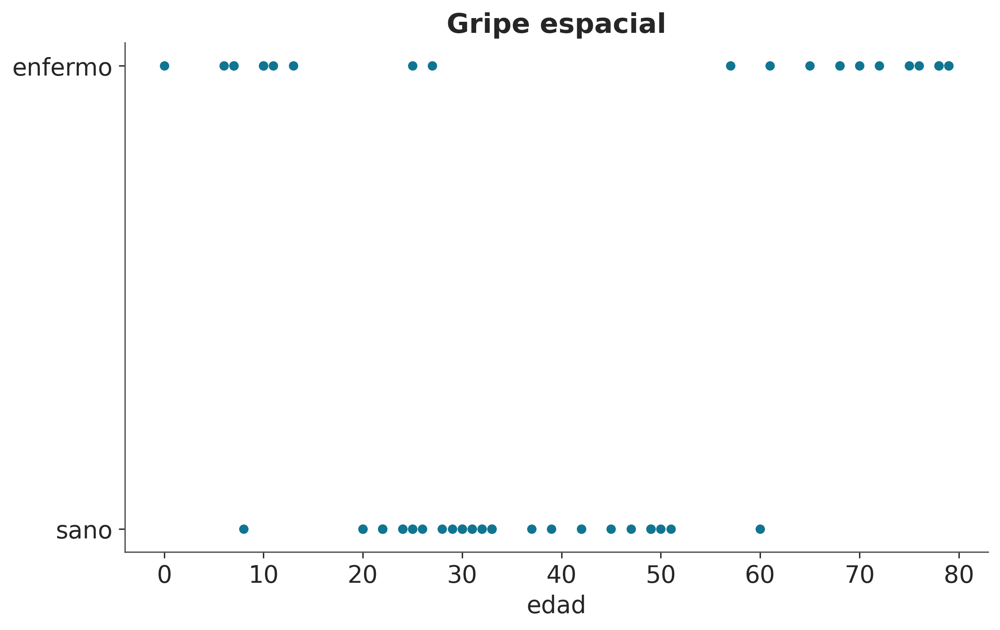

In [33]:
df_sf = pd.read_csv('../datos/gripe_espacial.csv')
age = df_sf.age.values[:, None]
space_flu = df_sf.space_flu

ax = df_sf.plot.scatter('age', 'space_flu', figsize=(8, 5))
ax.set_ylabel("")
ax.set_xlabel("edad")
ax.set_title("Gripe espacial")
ax.set_yticks([0, 1])
ax.set_yticklabels(['sano', 'enfermo']);

In [34]:
with pm.Model() as modelo_gripe_espacial:
    ℓ = pm.InverseGamma('ℓ', **get_ig_params(age))
    cov = pm.gp.cov.ExpQuad(1, ℓ) + pm.gp.cov.WhiteNoise(1E-5)
    gp = pm.gp.Latent(cov_func=cov)
    f = gp.prior('f', X=age)
    y_ = pm.Bernoulli('y', p=pm.math.sigmoid(f), observed=space_flu)
    idata_gripe_espacial = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ℓ, f_rotated_]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 11 seconds.


In [35]:
X_new = np.linspace(0, 80, 60)[:, None]

    
with modelo_gripe_espacial:
    f_pred = gp.conditional('f_pred', X_new) 
    idata_gripe_espacial_subset = idata_gripe_espacial.sel(draw=slice(0, None, 100))
    pred_samples_gripe = pm.sample_posterior_predictive(idata_gripe_espacial, var_names=["f_pred"],
                                                        random_seed=123)


f_pred_gripe_espacial = az.extract(pred_samples_gripe, group="posterior_predictive")['f_pred'].values

Sampling: [f_pred]


Output()

/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/plots/hdiplot.py:161: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


Text(0.5, 0, 'edad')

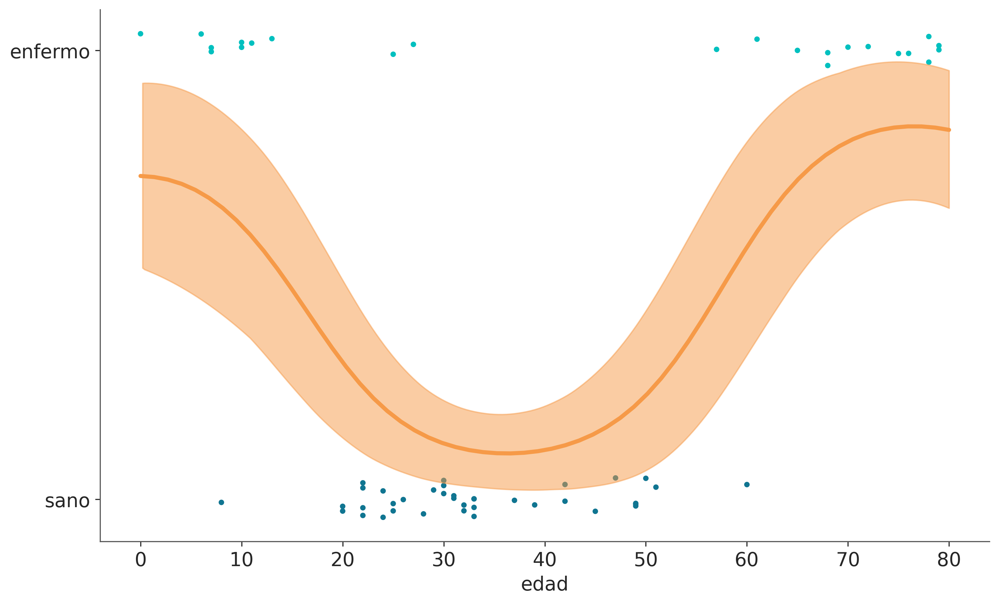

In [36]:
_, ax = plt.subplots(figsize=(10, 6))

fp = logistic(f_pred_gripe_espacial)
fp_mean = np.nanmean(fp, 1)

ax.scatter(age, np.random.normal(space_flu, 0.02),
           marker='.', color=[f'C{ci}' for ci in space_flu])

ax.plot(X_new[:, 0], fp_mean, 'C2', lw=3)

az.plot_hdi(X_new[:, 0], fp.T, color='C2', smooth=True)
ax.set_yticks([0, 1])
ax.set_yticklabels(['sano', 'enfermo'])
ax.set_xlabel('edad')

## Proceso de Cox

<br>

* Ahora vamos a modelar datos de conteo. 
* Utilizaremos la distribución de Poisson como likelihood y la tasa se modelará utilizando un proceso gaussiano. y utilizaremos la función exponencial como función de enlace inversa.

* En la literatura es común encontrar este tipo de modelos bajo el nombre de proceso de Poisson o proceso de Cox. 

* Un proceso de Poisson es un proceso estocástico donde cada conjunto finito de puntos se distribuye siguiendo una Poisson. 

* Un proceso de Cox es una proceso de Poisson cuya tasa es en sí misma un proceso estocástico

<br>

## Accidentes mineros

<br>
<br>

* Este dataset ya lo vimos.

* En este caso haremos uso de una columna de datos donde cada entrada corresponde con el tiempo (en años) en el que ocurrió cada accidente.

<br>
<br>

In [37]:
coal_df = pd.read_csv('../datos/coal.csv', header=None)
coal_df.head()

,0
0,1851.2026
1,1851.6324
2,1851.9692
3,1851.9747
4,1852.3142


## Regresión??

<br>

* Si solo tenemos una columna/variable, como podemos hacer regressión?

* Vamos discretizar los datos, como si estuviéramos construyendo un histograma.
* Vamos a utilizar los centros de los intervalos como la variable $X$ y los conteos por intervalo como la variable $Y$.

<br>

In [38]:
# discretizamos los datos
years = int((coal_df.max() - coal_df.min()).iloc[0])
bins = years // 4
hist, x_edges = np.histogram(coal_df, bins=bins)
# calculamos la ubicación de los centros de los datos discretizados
x_centers = x_edges[:-1] + (x_edges[1] - x_edges[0]) / 2
# xdata tiene que ser 2D para los GPS
x_data = x_centers[:, None]
y_data = hist

In [39]:
with pm.Model() as modelo_minas:
    ℓ = pm.InverseGamma('ℓ', **get_ig_params(x_edges))
    cov = pm.gp.cov.ExpQuad(1, ls=ℓ) + pm.gp.cov.WhiteNoise(1E-5)
    gp = pm.gp.Latent(cov_func=cov)
    f = gp.prior('f', X=x_data)

    y_pred = pm.Poisson('y_pred', mu=pm.math.exp(f), observed=y_data)
    idata_minas = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ℓ, f_rotated_]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 23 seconds.


/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/plots/hdiplot.py:161: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/plots/hdiplot.py:161: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


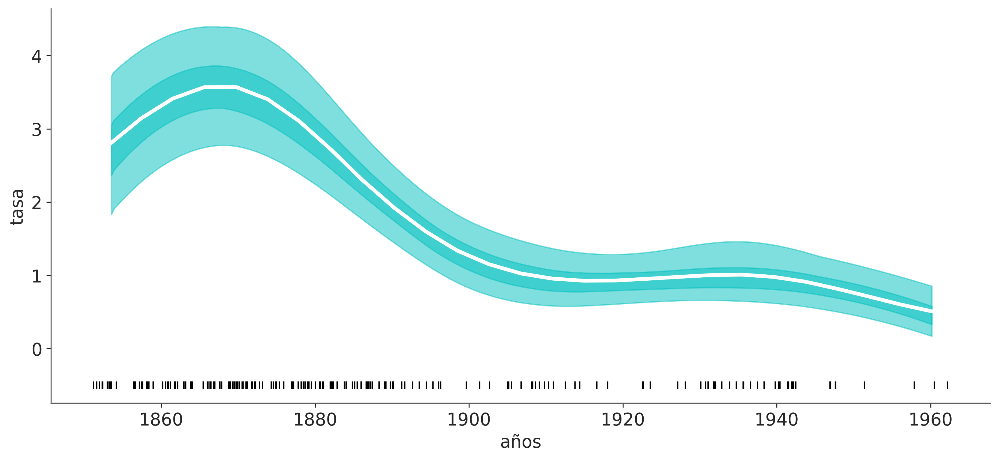

In [40]:
_, ax = plt.subplots(figsize=(11, 5))

f_trace = np.exp(idata_minas.posterior['f'].stack(samples=("chain", "draw")).T) / 4
rate_median = np.median(f_trace, axis=0)

ax.plot(x_centers, rate_median, 'w', lw=3)
az.plot_hdi(x_centers, f_trace)

az.plot_hdi(x_centers, f_trace, hdi_prob=0.5,
            plot_kwargs={'alpha': 0})

ax.plot(coal_df, np.zeros_like(coal_df)-0.5, 'k|')
ax.set_xlabel('años')
ax.set_ylabel('tasa');

## Regresión con correlación espacial

<br>
<br>

* Los GPs son comunmente utilizados para modelar datos espaciales
* En estos datos suele ser de interés tener en cuenta que observaciones geográficamente cercanas tienden a compartir similitudes.
<br>
<br>


### Sociedades insulares

<br>
<br>

* Tenemos 10 sociedades/islas diferentes
* Para cada una de ellas, tenemos la cantidad de herramientas que utilizan.
* Algunas teorías predicen que las poblaciones más grandes desarrollan y mantienen más herramientas que las poblaciones más pequeñas.
* Otro factor importante que afecta al número de herramientas son las tasas de contacto entre las sociedades insulares. 

<br>
<br>

Este ejemplo está basado en un ejemplo de _Statistical Rethinking_.

### Sociedades insulares

<br>
<br>

* Podemos pensar un problema de regresión donde la variable dependiente es la cantidad de herramientas y la variable independiente es la población. 
* Como el número de herramientas es una variable de conteo, podemos utilizar una distribución de Poisson.
* Además, tenemos buenas razones teóricas para pensar que el logaritmo de la población es una mejor variable que el tamaño absoluto.
* Una forma de incluir la tasa de contacto es utilizar la distancia entre islas como un proxy, ya que es razonable suponer que las sociedades geográficamente cercanas entran en contacto con más frecuencia que las distantes.

<br>
<br>

Este ejemplo está basado en un ejemplo de _Statistical Rethinking_.

Omitiendo priors, el modelo que vamos a construir es:


$$
\begin{align*}
    f &\sim \mathcal{GP}([0, \dots, 0], \kappa(\text{Coords}, \text{Coords'})) \\
    \mu &\sim \exp(\alpha + \beta \log(\text{pop}) + f) \\
    Y &\sim \text{Pois}(\mu)
\end{align*}
$$

### Distancia de semiverseno

<br>
<br>

* La información sobre la distribución espacial está en términos de latitudes y longitudes
* Los kernels en PyMC suponen que las distancias son todas euclídias. 
* Por lo que vamos a tener que definir nuestro propio kernel
* La distancia de semiverseno determina la distancia del círculo máximo entre dos puntos en una esfera dadas sus longitudes y latitudes.
* La distancia del círculo máximo es la distancia más corta entre dos puntos en la superficie de una esfera medida a lo largo de la superficie de la esfera.

<br>

In [41]:
islands = pd.read_csv('../datos/islands.csv')
X = islands[["lat", "lon"]].values
culture_labels = islands.culture.values
index = islands.index.values
log_pop = islands.logpop
total_tools = islands.total_tools

In [42]:
def haversine_distance(lat, lon, r=6.371):

    lat = np.radians(lat)
    lon = np.radians(lon)
    
    latd = lat[:,None] - lat
    lond = lon[:,None] - lon

    d = np.cos(lat[:,None]) * np.cos(lat)
    a = np.sin(latd / 2)** 2 + d * np.sin(lond / 2)** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    return r * c

islands_dist = haversine_distance(X[:,0], X[:,1])

In [43]:
class ExpQuadHaversine(pm.gp.cov.Stationary):
    def __init__(self, input_dims, ls, ls_inv=None, r=6.371, active_dims=None):
        super().__init__(input_dims, ls=ls,  ls_inv=ls_inv, active_dims=active_dims)
        self.r = r # earth radius in thousands of km

    def haversine_distance(self, X):

        lat = np.radians(X[:, 0])
        lon = np.radians(X[:, 1])

        latd = lat[:,None] - lat
        lond = lon[:,None] - lon

        d = pt.cos(lat[:,None]) * pt.cos(lat)
        a = pt.sin(latd / 2)** 2 + d * pt.sin(lond / 2)** 2
        c = 2 * pt.arctan2(pt.sqrt(a), pt.sqrt(1 - a))

        return self.r * c

    def full(self, X, _):
        return pt.exp(-0.5 * self.haversine_distance(X))

In [44]:
with pm.Model() as model_islands:
    η = pm.Exponential('η', 2)
    ℓ = pm.InverseGamma('ℓ', **get_ig_params(islands_dist))
    
    cov = η * ExpQuadHaversine(2, ls=ℓ)
    gp = pm.gp.Latent(cov_func=cov)
    f = gp.prior('f', X=X)

    α = pm.Normal('α', 0, 5)
    β = pm.Normal('β', 0, 1)
    μ = pm.math.exp(α + β * log_pop + f)
    _ = pm.Poisson('tt_pred', μ, observed=total_tools)
    idata_islands = pm.sample(target_accept=0.9, random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [η, ℓ, f_rotated_, α, β]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 62 seconds.


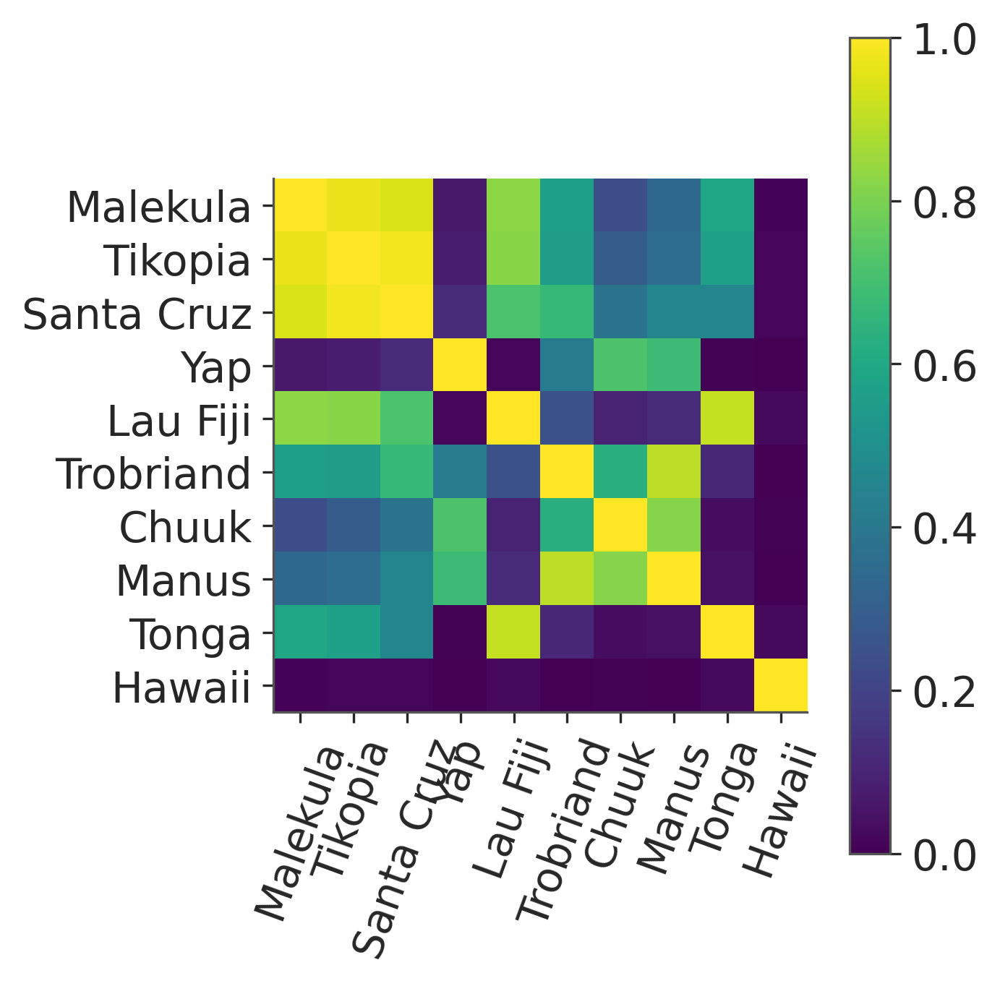

In [45]:
posterior_islands = idata_islands.posterior.stack(samples=("chain", "draw"))
trace_η = posterior_islands['η'].values
trace_ℓ = posterior_islands['ℓ'].values

# Calcular la covarianza mediana posterior entre sociedades
Σ = np.median(trace_η) * (np.exp(-(islands_dist)**2 / (2*np.median(trace_ℓ)**2)))


# Convertir a matriz de correlación
Σ_post = np.diag(np.diag(Σ)**-0.5)
ρ = Σ_post @  Σ @ Σ_post
ρ = pd.DataFrame(ρ, index=culture_labels, columns=culture_labels)

fig, ax = plt.subplots(figsize=(4.5, 4.5))
im = ax.imshow(ρ, cmap='viridis', vmin=0, vmax=1)

ticks_loc = np.arange(10)
ax.set_xticks(ticks_loc)
ax.set_yticks(ticks_loc)
ax.set_xticklabels(culture_labels, rotation=70)
ax.set_yticklabels(culture_labels)
fig.colorbar(im, ax=ax);

/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/plots/hdiplot.py:161: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


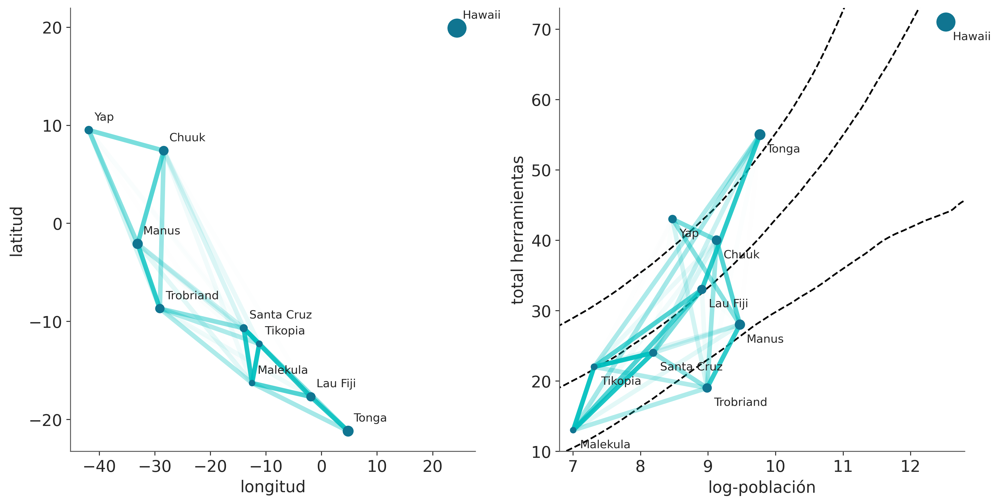

In [55]:
# scale point size to logpop
logpop = np.copy(log_pop)
logpop /= logpop.max()
psize = np.exp(logpop*5.5)
log_pop_seq = np.linspace(6, 14, 100)
lambda_post = np.exp(posterior_islands['α'].values[:, None] +
                     posterior_islands['β'].values[:, None] * log_pop_seq)

_, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].scatter(islands.lon, islands.lat, psize, zorder=3)
ax[1].scatter(islands.logpop, islands.total_tools, psize, zorder=3)

for i, itext in enumerate(culture_labels):
    ax[0].text(islands.lon[i]+1, islands.lat[i]+1, itext)
    ax[1].text(islands.logpop[i]+.1, islands.total_tools[i]-2.5, itext)


ax[1].plot(log_pop_seq, np.median(lambda_post, axis=0), 'k--')

az.plot_hdi(log_pop_seq, lambda_post,
            hdi_prob=0.8,
            fill_kwargs={'alpha':0},
            plot_kwargs={'color':'k', 'ls':'--', 'alpha':1})


for i in range(10):
    for j in np.arange(i+1, 10):
        ax[0].plot((islands.lon[i], islands.lon[j]),
                   (islands.lat[i], islands.lat[j]), 'C1-',
                   alpha=ρ.iloc[i, j]**2, lw=4)
        ax[1].plot((islands.logpop[i], islands.logpop[j]),
                   (islands.total_tools[i], islands.total_tools[j]), 'C1-',
                   alpha=ρ.iloc[i, j]**2, lw=4)
ax[0].set_xlabel('longitud')
ax[0].set_ylabel('latitud')


ax[1].set_xlabel('log-población')
ax[1].set_ylabel('total herramientas')
ax[1].set_xlim(6.8, 12.8)
ax[1].set_ylim(10, 73);

## GPs pueden ser costosos

<br>
<br>

* Los procesos gaussianos pueden ser lentos 
* La razón principal es que su cálculo requiere que invirtamos una matriz, cuyo tamaño aumenta con el número de observaciones. 
* En la práctica se utiliza la descomposición de Cholesky --> $\mathcal{O}(n^3)$.
* Existen numerosas aproximaciones para calcular GPs más rápido y/o con menos uso de memoria.

<br>
<br>


## Proceso Gaussiano en Espacios de Hilbert 

<br>
<br>

* Los HSGP son una aproximación que consiste en definir una serie de funciones bases ortogonales entre si.
* Un espacio de Hilbert es una generalización del espacio euclídeo que nos brinda el marco matemático para pensar funciones ("vectores infinitos") y sus distancia, ángulos, etc.
* Los HSGP escalan como $\mathcal{O}(mn + m)$ para $m$ bases y $n$ observaciones

<br>
<br>

### Limitaciones HSGP

<br>
<br>

* Funcionan muy bien para 1 y 2 dimensiones, quizá 3
* Funcionan solo para algunos kernels como el cuadrático exponencial o Matern

<br>
<br>



### Bicicletas Gaussianas

<br>
<br>

* Queremos modelar la cantidad de bicicletas alquiladas en función del tiempo, horas del día.
<br>
<br>

In [47]:
bicis = pd.read_csv("../datos/bicis.csv")
y = bicis["alquiladas"].values
X = bicis["hora"].values[:,None]

In [48]:
with pm.Model() as model_hsgp:
    ℓ = pm.InverseGamma('ℓ', **get_ig_params(X))

    cov = pm.gp.cov.ExpQuad(1, ls=ℓ)
    gp = pm.gp.HSGP(m=[10], c=1.5, cov_func=cov)
    f = gp.prior('f', X=X)
    
    α = pm.HalfNormal('α', 1)
    _ = pm.NegativeBinomial("obs", np.exp(f), α, observed=y)

    idata_hsgp = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ℓ, f_hsgp_coeffs_, α]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 12 seconds.


In [49]:
az.summary(idata_hsgp, var_names=["ℓ", "α"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ℓ,3.403,0.274,2.910,3.927,0.008,0.005,1265.0,1890.0,1.0
α,1.854,0.140,1.606,2.126,0.002,0.002,3677.0,2934.0,1.0


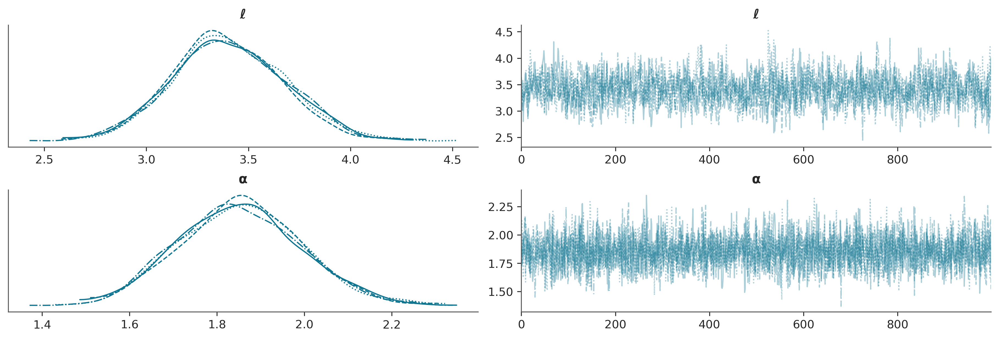

In [50]:
az.plot_trace(idata_hsgp, var_names=["ℓ", "α"]);

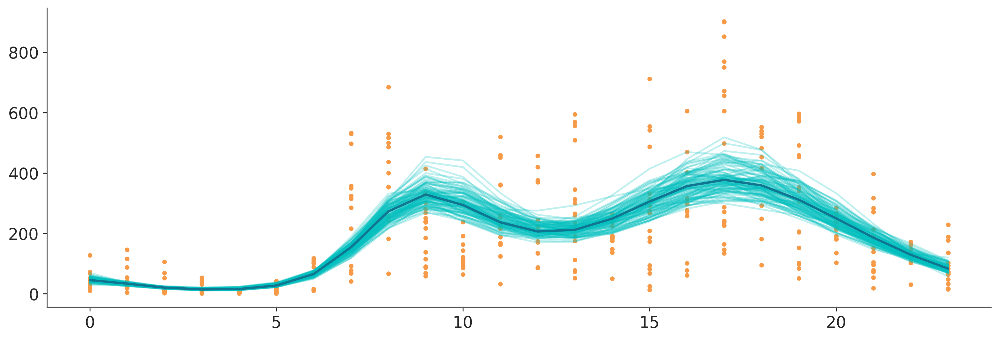

In [51]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
ax.plot(bicis["hora"].values, bicis["alquiladas"].values, "C2.")


f = az.extract(idata_hsgp, group="posterior", var_names="f")
idx = np.argsort(X[:,0])
ax.plot(bicis["hora"].values[idx], np.exp(f.values[idx,:100]), alpha=0.25, color="C1")

ax.plot(bicis["hora"].values[idx], np.exp(f.values[idx].mean(1)), color="C0", lw=2);

### HSGPs en Bambi

```python
bmb.Model("rented ~ 0 + hsgp(hour, m=10, c=1.5)", bikes, family="negativebinomial")
```

Esto funcionará, pero en general combiene definir priors por nuestra cuenta. Esto dará como resultado un muestreo mucho más rápido y muestras más confiables.

In [52]:
prior_gp = {
    "sigma": bmb.Prior("Gamma", mu=1, sigma=0.01),
    "ell": bmb.Prior("InverseGamma", **get_ig_params(X)) 
}

priors = {
    "hsgp(hora, m=10, c=1.5)": prior_gp,
    "alpha": bmb.Prior("HalfNormal", sigma=1)
}

model_hsb = bmb.Model("alquiladas ~ 0 + hsgp(hora, m=10, c=1.5)", bicis, family="negativebinomial", priors=priors)
idata_hsb = model_hsb.fit(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, hsgp(hora, m=10, c=1.5)_sigma, hsgp(hora, m=10, c=1.5)_ell, hsgp(hora, m=10, c=1.5)_weights_raw]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.


In [53]:
az.summary(idata_hsb, var_names=["hsgp(hora, m=10, c=1.5)_ell", "alquiladas_alpha"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"hsgp(hora, m=10, c=1.5)_ell",3.415,0.270,2.909,3.906,0.008,0.005,1281.0,1938.0,1.0
alquiladas_alpha,1.855,0.137,1.614,2.124,0.002,0.002,3651.0,2997.0,1.0


/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/rcparams.py:368: FutureWarning: stats.hdi_prob is deprecated since 0.18.0, use stats.ci_prob instead
  warnings.warn(


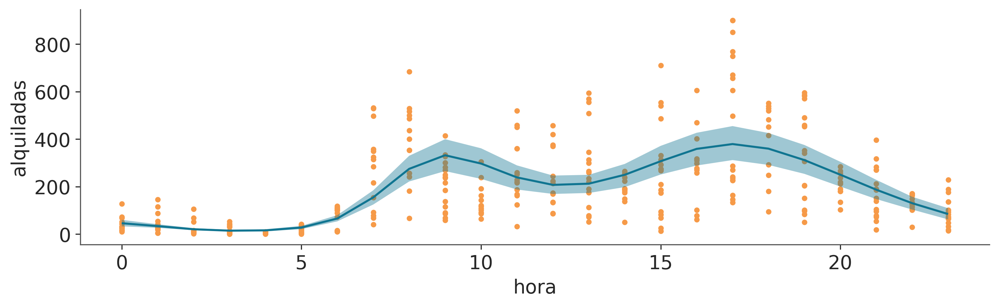

In [54]:
_, ax = bmb.interpret.plot_predictions(model_hsb, idata_hsb, ["hora"],
                                       fig_kwargs={"figsize": (10, 3)})
ax[0].plot(bicis["hora"].values, bicis["alquiladas"].values, "C2.", zorder=0);